In [ ]:
import sqlite3
import os
import csv

if os.path.exists('/content/heart_disease_data.db'):
  os.remove('/content/heart_disease_data.db')

# Connect to the SQLite database
conn = sqlite3.connect('heart_disease_data.db')
conn.execute("PRAGMA foreign_keys = 1")  # Enable foreign key constraints
cursor = conn.cursor()

# Create tables

general_info_table_query = '''
CREATE TABLE IF NOT EXISTS GeneralInfo (
    GeneralInfoID INTEGER PRIMARY KEY NOT NULL,
    State TEXT,
    Sex TEXT,
    AgeCategory TEXT,
    RaceEthnicityCategory TEXT,
    HeightInMeters INTEGER,
    WeightInKilograms INTEGER,
    BMI INTEGER
);
'''

health_condition_table_query = '''
CREATE TABLE IF NOT EXISTS HealthCondition (
    HealthConditionID INTEGER PRIMARY KEY NOT NULL,
    GeneralInfoID INTEGER NOT NULL,
    MedicalScreeningID INTEGER NOT NULL,
    GeneralHealth TEXT,
    PhysicalHealthDays INTEGER,
    MentalHealthDays INTEGER,
    RemovedTeeth TEXT,
    HadHeartAttack TEXT,
    HadAngina TEXT,
    HadStroke TEXT,
    HadAsthma TEXT,
    HadSkinCancer TEXT,
    HadCOPD TEXT,
    HadDepressiveDisorder TEXT,
    HadKidneyDisease TEXT,
    HadArthritis TEXT,
    HadDiabetes TEXT,
    DeafOrHardOfHearing TEXT,
    BlindOrVisionDifficulty TEXT,
    DifficultyConcentrating TEXT,
    DifficultyWalking TEXT,
    DifficultyDressingBathing TEXT,
    DifficultyErrands TEXT,
    FOREIGN KEY (GeneralInfoID) REFERENCES GeneralInfo(GeneralInfoID),
    FOREIGN KEY (MedicalScreeningID) REFERENCES MedicalScreening(MedicalScreeningID)
);
'''


health_behavior_table_query = '''
CREATE TABLE IF NOT EXISTS HealthBehavior (
    HealthBehaviorID INTEGER PRIMARY KEY NOT NULL,
    HealthConditionID INTEGER NOT NULL,
    MedicalScreeningID INTEGER NOT NULL,
    PhysicalActivities TEXT,
    SleepHours INTEGER,
    SmokerStatus TEXT,
    ECigaretteUsage TEXT,
    AlcoholDrinkers TEXT,
    FOREIGN KEY (HealthConditionID) REFERENCES HealthCondition(HealthConditionID),
    FOREIGN KEY (MedicalScreeningID) REFERENCES MedicalScreening(MedicalScreeningID)
);
'''

medical_screening_table_query = '''
CREATE TABLE IF NOT EXISTS MedicalScreening (
    MedicalScreeningID INTEGER PRIMARY KEY NOT NULL,
    GeneralInfoID INTEGER NOT NULL,
    LastCheckupTime TEXT,
    HIVTesting TEXT,
    FluVaxLast12 TEXT,
    PneumoVaxEver TEXT,
    TetanusLast10Tdap TEXT,
    HighRiskLastYear TEXT,
    CovidPos TEXT,
    ChestScan TEXT,
    FOREIGN KEY (GeneralInfoID) REFERENCES GeneralInfo(GeneralInfoID)
);
'''

# Execute SQL queries to create tables
cursor.execute("DROP TABLE IF EXISTS GeneralInfo;")
cursor.execute(general_info_table_query)
cursor.execute("DROP TABLE IF EXISTS HealthCondition;")
cursor.execute(health_condition_table_query)
cursor.execute("DROP TABLE IF EXISTS HealthBehavior;")
cursor.execute(health_behavior_table_query)
cursor.execute("DROP TABLE IF EXISTS MedicalScreening;")
cursor.execute(medical_screening_table_query)




# Read CSV file
csv_file_path = '/content/heart_2022.csv'

header = True
head = []
general_info_data = []
health_condition_data = []
health_behavior_data = []
medical_screening_data = []
MedicalScreeningID = 1
general_info_id = 1
health_behavior_id = 1
health_condition_id = 1

with open(csv_file_path) as file:
  csv_reader = csv.reader(file)
  for line in csv_reader:

    if header:
      header = False
      head = line
    else:
      general_info_data.append([general_info_id,
            line[head.index('State')],
            line[head.index('Sex')],
            line[head.index('AgeCategory')],
            line[head.index('RaceEthnicityCategory')],
            line[head.index('HeightInMeters')],
            line[head.index('WeightInKilograms')],
            line[head.index('BMI')]])
      health_condition_data.append([
            health_condition_id,
            MedicalScreeningID,  # Assuming 'MedicalScreeningID' is present in the CSV data
            general_info_id,  # Assuming 'GeneralInfoID' is present in the CSV data
            line[head.index('GeneralHealth')],
            line[head.index('PhysicalHealthDays')],
            line[head.index('MentalHealthDays')],
            line[head.index('RemovedTeeth')],
            line[head.index('HadHeartAttack')],
            line[head.index('HadAngina')],
            line[head.index('HadStroke')],
            line[head.index('HadAsthma')],
            line[head.index('HadSkinCancer')],
            line[head.index('HadCOPD')],
            line[head.index('HadDepressiveDisorder')],
            line[head.index('HadKidneyDisease')],
            line[head.index('HadArthritis')],
            line[head.index('HadDiabetes')],
            line[head.index('DeafOrHardOfHearing')],
            line[head.index('BlindOrVisionDifficulty')],
            line[head.index('DifficultyConcentrating')],
            line[head.index('DifficultyWalking')],
            line[head.index('DifficultyDressingBathing')],
            line[head.index('DifficultyErrands')]
        ])

      health_behavior_data.append([
            health_behavior_id,
            health_condition_id,  # Assuming 'HealthConditionID' is present in the CSV data
            MedicalScreeningID,  # Assuming 'MedicalScreeningID' is present in the CSV data
            line[head.index('PhysicalActivities')],
            line[head.index('SleepHours')],
            line[head.index('SmokerStatus')],
            line[head.index('ECigaretteUsage')],
            line[head.index('AlcoholDrinkers')]
        ])
      medical_screening_data.append([
            MedicalScreeningID,
            general_info_id,  # Assuming 'GeneralInfoID' is present in the CSV data
            line[head.index('LastCheckupTime')],
            line[head.index('HIVTesting')],
            line[head.index('FluVaxLast12')],
            line[head.index('PneumoVaxEver')],
            line[head.index('TetanusLast10Tdap')],
            line[head.index('HighRiskLastYear')],
            line[head.index('CovidPos')],
            line[head.index('ChestScan')]
        ])

      health_behavior_id += 1
      MedicalScreeningID += 1
      health_condition_id += 1
      general_info_id += 1





# Insert data into tables
general_info_insert_query = '''
INSERT INTO GeneralInfo (GeneralInfoID, State, Sex, AgeCategory, RaceEthnicityCategory, HeightInMeters, WeightInKilograms, BMI)
VALUES (?, ?, ?, ?, ?, ?, ?, ?);
'''

health_condition_insert_query = '''
INSERT INTO HealthCondition (HealthConditionID, GeneralInfoID, MedicalScreeningID, GeneralHealth, PhysicalHealthDays, MentalHealthDays,
                             RemovedTeeth, HadHeartAttack, HadAngina, HadStroke, HadAsthma, HadSkinCancer, HadCOPD, HadDepressiveDisorder, HadKidneyDisease,
                             HadArthritis,  HadDiabetes,
                             DeafOrHardOfHearing, BlindOrVisionDifficulty, DifficultyConcentrating,
                             DifficultyWalking, DifficultyDressingBathing, DifficultyErrands)
VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?, ?);
'''

health_behavior_insert_query = '''
INSERT INTO HealthBehavior (HealthBehaviorID, HealthConditionID, MedicalScreeningID, PhysicalActivities, SleepHours, SmokerStatus,
                             ECigaretteUsage, AlcoholDrinkers)
VALUES (?, ?, ?, ?, ?, ?, ?, ?);
'''

medical_screening_insert_query = '''
INSERT INTO MedicalScreening (MedicalScreeningID, GeneralInfoID, LastCheckupTime, HIVTesting, FluVaxLast12, PneumoVaxEver,
                               TetanusLast10Tdap, HighRiskLastYear, CovidPos, ChestScan)
VALUES (?, ?, ?, ?, ?, ?, ?, ?, ?, ?);
'''

# Insert data into tables
cursor.executemany(general_info_insert_query, general_info_data)
cursor.executemany(medical_screening_insert_query, medical_screening_data)
cursor.executemany(health_condition_insert_query, health_condition_data)
cursor.executemany(health_behavior_insert_query, health_behavior_data)


# Commit changes and close connection
conn.commit()
conn.close()

In [ ]:
It creates an SQLite database named 'heart_disease_data.db' and populates it with data from a CSV file named 'heart_2022.csv'. It defines the database schema with four tables ('GeneralInfo', 'HealthCondition', 'HealthBehavior', 'MedicalScreening'), establishes a connection to the database, reads data from the CSV file, inserts the data into the respective tables, and then commits the changes before closing the database connection. This sets up the foundation for further analysis or modeling tasks related to heart disease prediction.

ER Diagrams for the tables:

         +-------------------+             +---------------------+
         | GeneralInfo       |             | HealthCondition     |
         +-------------------+             +---------------------+
         | GeneralInfoID [PK]|<---+        | HealthConditionID [PK]|
         | State             |    |        | GeneralInfoID [FK]   |
         | Sex               |    +------->| MedicalScreeningID [FK]|
         | AgeCategory       |             | GeneralHealth       |
         | RaceEthnicityCategory |          | PhysicalHealthDays  |
         | HeightInMeters    |             | MentalHealthDays    |
         | WeightInKilograms |             | RemovedTeeth        |
         | BMI               |             | HadHeartAttack      |
         +-------------------+             | HadAngina           |
                                            | ...                 |
                                            +---------------------+

         +-------------------+             +---------------------+
         | HealthBehavior    |             | MedicalScreening    |
         +-------------------+             +---------------------+
         | HealthBehaviorID [PK]|          | MedicalScreeningID [PK]|
         | HealthConditionID [FK]|<--------+| GeneralInfoID [FK]   |
         | MedicalScreeningID [FK]|         | LastCheckupTime      |
         | PhysicalActivities |            | HIVTesting           |
         | SleepHours        |            | FluVaxLast12         |
         | SmokerStatus      |            | PneumoVaxEver        |
         | ECigaretteUsage   |            | TetanusLast10Tdap    |
         | AlcoholDrinkers   |            | HighRiskLastYear     |
         +-------------------+            | CovidPos             |
                                           | ChestScan            |
                                           +---------------------+

SyntaxError: invalid syntax (<ipython-input-6-ab5cbfd83c0b>, line 1)

In [ ]:
import sqlite3
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

# Connect to the SQLite database
conn = sqlite3.connect('heart_disease_data.db')

# SQL statement to fetch data using joins
sql_query = '''
SELECT *
FROM GeneralInfo gi
LEFT JOIN HealthCondition hc ON gi.GeneralInfoID = hc.GeneralInfoID
LEFT JOIN HealthBehavior hb ON hc.HealthConditionID = hb.HealthConditionID
LEFT JOIN MedicalScreening ms ON gi.GeneralInfoID = ms.GeneralInfoID;
'''

# Fetch data into a Pandas DataFrame
df = pd.read_sql_query(sql_query, conn)
df = df.loc[:, ~df.columns.duplicated()]
#print(df[:5])
# Close connection
conn.close()

#source = df.drop('HadHeartAttack', axis=1)
df=df.head(20000)
source = df
target = df['HadHeartAttack']

train, test = train_test_split(source, test_size = 0.2, random_state = 42,
                                      stratify=target)

#print(type(train))


In [ ]:
print(df.columns)

Index(['GeneralInfoID', 'State', 'Sex', 'AgeCategory', 'RaceEthnicityCategory',
       'HeightInMeters', 'WeightInKilograms', 'BMI', 'HealthConditionID',
       'MedicalScreeningID', 'GeneralHealth', 'PhysicalHealthDays',
       'MentalHealthDays', 'RemovedTeeth', 'HadHeartAttack', 'HadAngina',
       'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
       'HadDiabetes', 'DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
       'DifficultyConcentrating', 'DifficultyWalking',
       'DifficultyDressingBathing', 'DifficultyErrands', 'HealthBehaviorID',
       'PhysicalActivities', 'SleepHours', 'SmokerStatus', 'ECigaretteUsage',
       'AlcoholDrinkers', 'LastCheckupTime', 'HIVTesting', 'FluVaxLast12',
       'PneumoVaxEver', 'TetanusLast10Tdap', 'HighRiskLastYear', 'CovidPos',
       'ChestScan'],
      dtype='object')


In [ ]:
train.columns

Index(['GeneralInfoID', 'State', 'Sex', 'AgeCategory', 'RaceEthnicityCategory',
       'HeightInMeters', 'WeightInKilograms', 'BMI', 'HealthConditionID',
       'MedicalScreeningID', 'GeneralHealth', 'PhysicalHealthDays',
       'MentalHealthDays', 'RemovedTeeth', 'HadHeartAttack', 'HadAngina',
       'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD',
       'HadDepressiveDisorder', 'HadKidneyDisease', 'HadArthritis',
       'HadDiabetes', 'DeafOrHardOfHearing', 'BlindOrVisionDifficulty',
       'DifficultyConcentrating', 'DifficultyWalking',
       'DifficultyDressingBathing', 'DifficultyErrands', 'HealthBehaviorID',
       'PhysicalActivities', 'SleepHours', 'SmokerStatus', 'ECigaretteUsage',
       'AlcoholDrinkers', 'LastCheckupTime', 'HIVTesting', 'FluVaxLast12',
       'PneumoVaxEver', 'TetanusLast10Tdap', 'HighRiskLastYear', 'CovidPos',
       'ChestScan'],
      dtype='object')

It establishes a connection to the SQLite database 'heart_disease_data.db' and fetches data using SQL joins from multiple tables ('GeneralInfo', 'HealthCondition', 'HealthBehavior', 'MedicalScreening') into a Pandas DataFrame. It then subsets the data to the first 20,000 rows and splits it into training and testing sets for machine learning, with 'HadHeartAttack' being the target variable.

In [ ]:
null_counts = train.isnull().sum()

# Count missing values (including empty strings) in every column
missing_counts = train.apply(lambda x:x == '').sum()

# Replace null values with a specific value (e.g., -1)
#df_filled = train.fillna(-1)
# Convert empty strings to 0
df_filled = train.replace('', np.nan)
#df['HadHeartAttack']=t
print("\nDataFrame with null values replaced and empty strings converted to 0:")
print(df_filled)


DataFrame with null values replaced and empty strings converted to 0:
       GeneralInfoID    State     Sex      AgeCategory  \
8289            8290   Alaska  Female     Age 70 to 74   
1042            1043  Alabama  Female     Age 65 to 69   
19758          19759  Arizona  Female     Age 55 to 59   
12257          12258  Arizona  Female  Age 80 or older   
1192            1193  Alabama  Female              NaN   
...              ...      ...     ...              ...   
4326            4327  Alabama    Male     Age 75 to 79   
14861          14862  Arizona    Male     Age 60 to 64   
5641            5642   Alaska  Female     Age 60 to 64   
15706          15707  Arizona    Male     Age 55 to 59   
19482          19483  Arizona    Male     Age 55 to 59   

               RaceEthnicityCategory  HeightInMeters  WeightInKilograms  \
8289   Other race only, Non-Hispanic             NaN              73.03   
1042        White only, Non-Hispanic            1.80              99.79   
19758  

It calculates the count of missing values (including empty strings) in every column of the 'train' DataFrame and replaces empty strings with NaN (Not a Number) using NumPy. It then prints the modified DataFrame where null values have been replaced and empty strings converted to NaN.

In [ ]:
pip install ydata_profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 14.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 29.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 39.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=6b44f1d5ada83392fd40ef04879e1879584458379b9ff081a51d6ef2149673e2
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport

df = train
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df_filled.columns
print(df_filled)

       GeneralInfoID    State     Sex      AgeCategory  \
8289            8290   Alaska  Female     Age 70 to 74   
1042            1043  Alabama  Female     Age 65 to 69   
19758          19759  Arizona  Female     Age 55 to 59   
12257          12258  Arizona  Female  Age 80 or older   
1192            1193  Alabama  Female              NaN   
...              ...      ...     ...              ...   
4326            4327  Alabama    Male     Age 75 to 79   
14861          14862  Arizona    Male     Age 60 to 64   
5641            5642   Alaska  Female     Age 60 to 64   
15706          15707  Arizona    Male     Age 55 to 59   
19482          19483  Arizona    Male     Age 55 to 59   

               RaceEthnicityCategory  HeightInMeters  WeightInKilograms  \
8289   Other race only, Non-Hispanic             NaN              73.03   
1042        White only, Non-Hispanic            1.80              99.79   
19758                       Hispanic            1.57             151.05   
122

In [ ]:
non_col=['State','ChestScan','GeneralInfoID','HealthConditionID','MedicalScreeningID','HealthBehaviorID','RemovedTeeth','HadDepressiveDisorder','HadArthritis','DeafOrHardOfHearing', 'BlindOrVisionDifficulty', 'DifficultyConcentrating', 'DifficultyWalking', 'DifficultyDressingBathing', 'DifficultyErrands','TetanusLast10Tdap','PneumoVaxEver','FluVaxLast12']
df_filled.drop(columns=non_col, inplace=True)
# Combine age categories into two new columns


# Displaying the resulting DataFrame


In [ ]:
print(df_filled.columns)

Index(['Sex', 'AgeCategory', 'RaceEthnicityCategory', 'HeightInMeters',
       'WeightInKilograms', 'BMI', 'GeneralHealth', 'PhysicalHealthDays',
       'MentalHealthDays', 'HadHeartAttack', 'HadAngina', 'HadStroke',
       'HadAsthma', 'HadSkinCancer', 'HadCOPD', 'HadKidneyDisease',
       'HadDiabetes', 'PhysicalActivities', 'SleepHours', 'SmokerStatus',
       'ECigaretteUsage', 'AlcoholDrinkers', 'LastCheckupTime', 'HIVTesting',
       'HighRiskLastYear', 'CovidPos'],
      dtype='object')


It generates a comprehensive profiling report for the DataFrame 'train' using the ydata_profiling library. The ProfileReport function creates a detailed report containing statistics, histograms, correlations, missing values, and more, providing valuable insights into the structure and characteristics of the dataset.

In [ ]:
columns_to_convert = ['PhysicalHealthDays','MentalHealthDays','SleepHours','HeightInMeters','WeightInKilograms','BMI']

# Convert each column to numeric type, treating non-numeric values as NaN
for column in columns_to_convert:
    df_filled[column] = pd.to_numeric(df_filled[column], errors='coerce')

#df['HadHeartAttack'] = pd.to_numeric(df['HadHeartAttack'], errors='coerce')
print(df_filled['HeightInMeters'].unique())

[ nan 1.8  1.57 1.5  1.7  1.68 1.6  1.78 1.83 1.75 1.93 1.65 1.85 1.55
 1.52 1.73 1.91 1.63 1.88 1.47 1.42 1.54 1.98 1.82 1.14 1.72 2.03 1.96
 1.22 1.74 2.01 1.56 1.87 1.67 1.64 1.45 1.49 1.62 2.16 1.9  1.76 1.69
 1.79 1.35 1.61 1.37 0.91 1.4  1.53 1.71 2.06 1.3  2.26 1.24 1.84 1.59
 1.46 2.11]


It iterates over specified columns in the DataFrame 'df_filled' and converts their data type to numeric, treating non-numeric values as NaN. It then prints the unique values of the 'HeightInMeters' column to verify the conversion.

In [ ]:
column_types = df_filled.dtypes
categorical_columns = column_types[column_types == 'object'].index.tolist()
numerical_columns = column_types[column_types != 'object'].index.tolist()
print("Categorical columns:", categorical_columns)
print("Numerical columns:", numerical_columns)

Categorical columns: ['Sex', 'AgeCategory', 'RaceEthnicityCategory', 'GeneralHealth', 'HadHeartAttack', 'HadAngina', 'HadStroke', 'HadAsthma', 'HadSkinCancer', 'HadCOPD', 'HadKidneyDisease', 'HadDiabetes', 'PhysicalActivities', 'SmokerStatus', 'ECigaretteUsage', 'AlcoholDrinkers', 'LastCheckupTime', 'HIVTesting', 'HighRiskLastYear', 'CovidPos']
Numerical columns: ['HeightInMeters', 'WeightInKilograms', 'BMI', 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours']


It categorizes columns in the DataFrame 'df_filled' into two lists: 'categorical_columns' containing columns with object data type, and 'numerical_columns' containing columns with numeric data type. It then prints these lists to identify which columns are categorical and which are numerical in the dataset.

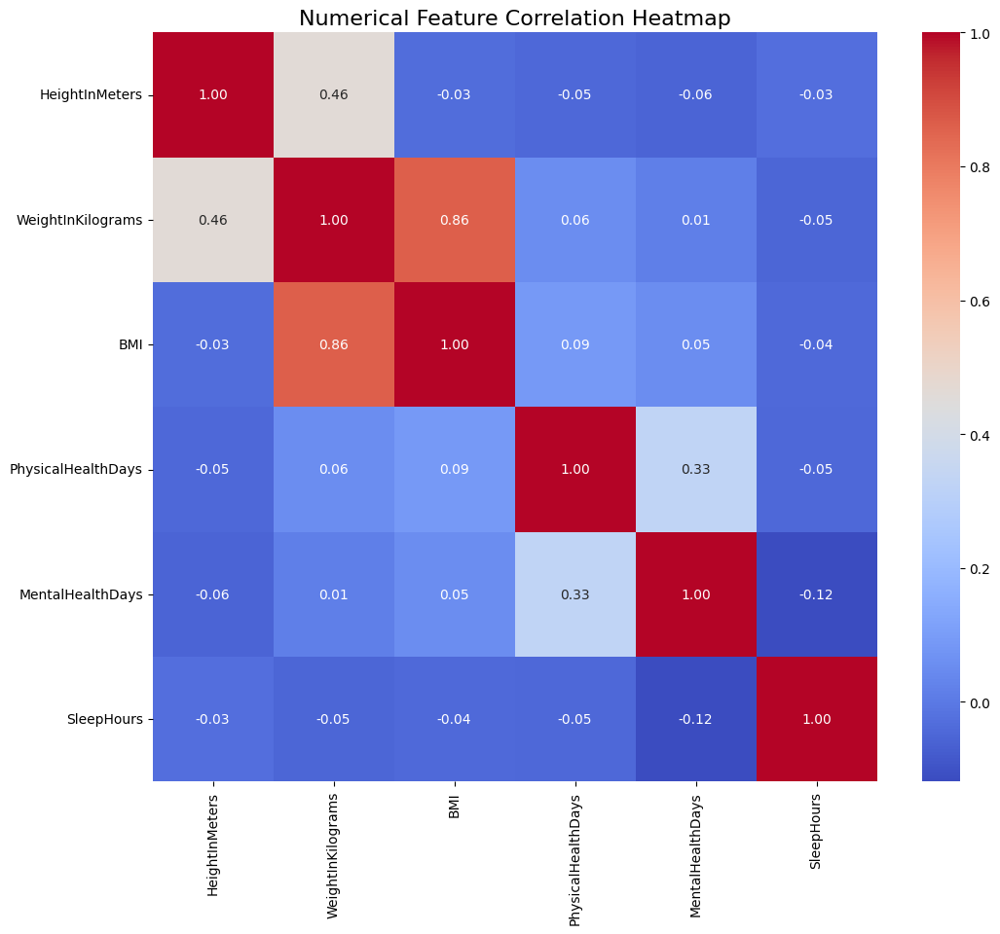

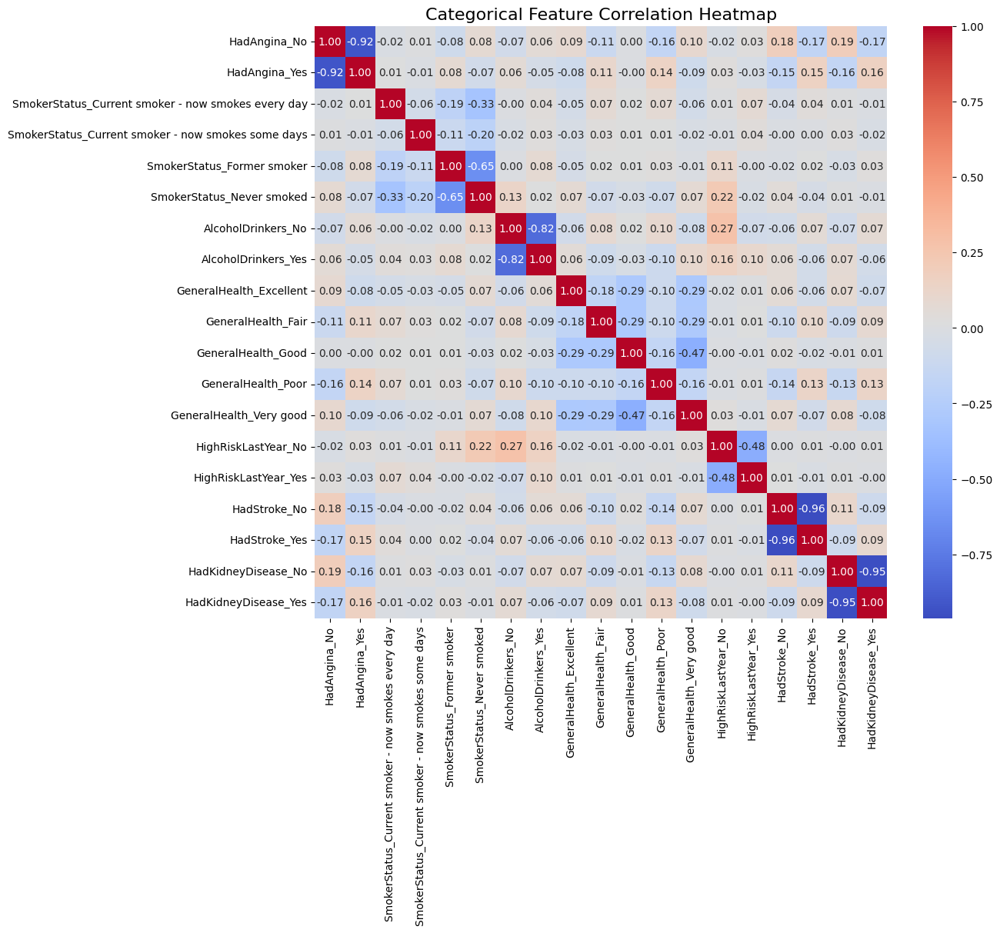

<ipython-input-12-7b7bd21924d3>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-12-7b7bd21924d3>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-12-7b7bd21924d3>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-12-7b7bd21924d3>:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
<ipython-input-12-7b7bd21924d3>:43: FutureWarning: 


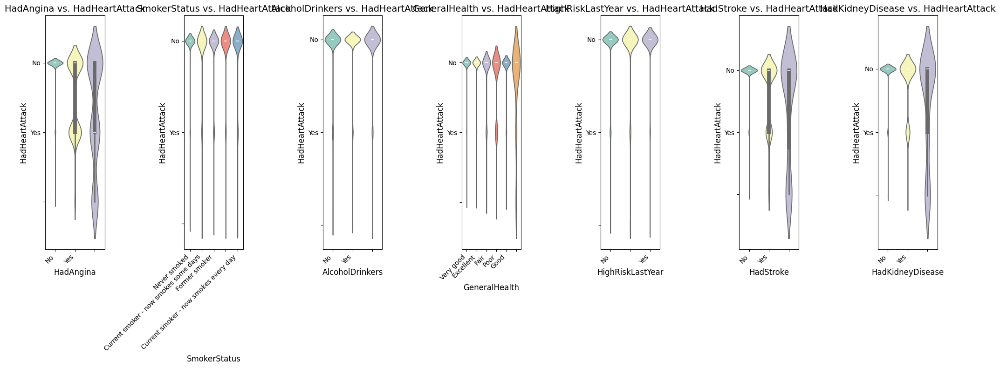

<ipython-input-12-7b7bd21924d3>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=df_filled[target], y=df_filled[feature], palette="Set3")
<ipython-input-12-7b7bd21924d3>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=df_filled[target], y=df_filled[feature], palette="Set3")
<ipython-input-12-7b7bd21924d3>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=df_filled[target], y=df_filled[feature], palette="Set3")
<ipython-input-12-7b7bd21924d3>:62: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and wi

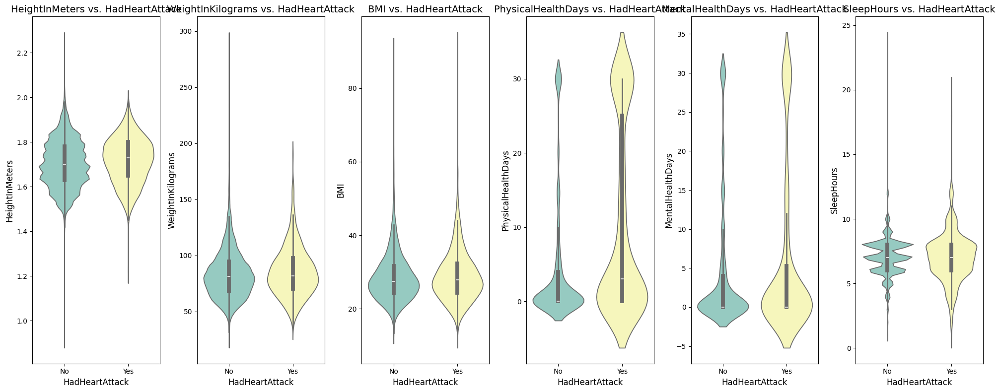

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame
# df = pd.read_csv('your_dataset.csv')

# Assuming 'target' is your target variable name
target = 'HadHeartAttack'

# Assuming 'categorical_features' is a list of categorical feature names
categorical_features = ['HadAngina', 'SmokerStatus', 'AlcoholDrinkers', 'GeneralHealth', 'HighRiskLastYear', 'HadStroke', 'HadKidneyDisease']

# Assuming 'numerical_features' is a list of numerical feature names
numerical_features = ['HeightInMeters', 'WeightInKilograms', 'BMI', 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours']

# Compute correlation matrix for numerical features
num_corr = df_filled[numerical_features].corr()

# Plot numerical feature correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(num_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Numerical Feature Correlation Heatmap", fontsize=16)
plt.show()

# Encode categorical features
df_encoded = pd.get_dummies(df_filled[categorical_features])

# Compute correlation matrix for encoded categorical features
cat_corr = df_encoded.corr()

# Plot categorical feature correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(cat_corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Categorical Feature Correlation Heatmap", fontsize=16)
plt.show()

# Violin plots for categorical features
plt.figure(figsize=(20, 8))  # Increase figure size for better spacing

for i, feature in enumerate(categorical_features):
    plt.subplot(1, len(categorical_features), i + 1)
    sns.violinplot(
        x=feature,
        y=target,
        data=df,
        palette="Set3",  # Use a color palette for better distinction
    )
    plt.xticks(rotation=45, ha='right', fontsize=10)  # Rotate and align x-axis labels
    plt.title(f"{feature} vs. {target}", fontsize=14)
    plt.xlabel(feature, fontsize=12)
    plt.ylabel(target, fontsize=12)

plt.tight_layout()
plt.show()

# Violin plots for numerical features
plt.figure(figsize=(20, 8))  # Increase figure size for better spacing

for i, feature in enumerate(numerical_features):
    plt.subplot(1, len(numerical_features), i + 1)
    sns.violinplot(x=df_filled[target], y=df_filled[feature], palette="Set3")
    plt.title(f"{feature} vs. {target}", fontsize=14)
    plt.xlabel(target, fontsize=12)
    plt.ylabel(feature, fontsize=12)

plt.tight_layout()
plt.show()


It visualizes the correlation between numerical and categorical features with the target variable 'HadHeartAttack'.

For numerical features, it computes the correlation matrix and plots a heatmap to visualize the correlations among them.

For categorical features, it first encodes them using one-hot encoding and then calculates the correlation matrix and plots a heatmap to visualize the correlations among them.

Additionally, it creates violin plots for each categorical and numerical feature against the target variable, providing insights into their distributions and relationship with the target variable.

In [ ]:
def get_outliers(train, column):
    # Calculate quartiles
    Q1 = train[column].quantile(0.25)
    Q3 = train[column].quantile(0.75)

    # Calculate IQR
    IQR = Q3 - Q1

    # Define lower and upper limits
    lower_limit = Q1 - 1.5 * IQR
    upper_limit = Q3 + 1.5 * IQR

    # Extract outliers
    outliers = train[(train[column] < lower_limit) | (train[column] > upper_limit)]

    return outliers, lower_limit, upper_limit

In [ ]:
def drop_outliers(train, columns):
    new_df = train.copy()  # Create a copy of the original DataFrame
    for column in columns:
        # Calculate quartiles
        Q1 = new_df[column].quantile(0.25)
        Q3 = new_df[column].quantile(0.75)

        # Calculate IQR
        IQR = Q3 - Q1

        # Define lower and upper limits
        lower_limit = Q1 - 1.5 * IQR
        upper_limit = Q3 + 1.5 * IQR
        print(lower_limit,upper_limit)
        # Drop outliers
        train = new_df[(new_df[column] >= lower_limit) & (new_df[column] <= int(upper_limit))]

    return train

In [ ]:
# List of columns to check for outliers
columns_to_check = numerical_columns
# Call the function to drop outliers from specified columns
df_filled = drop_outliers(df_filled, columns_to_check)

1.4049999999999998 2.0050000000000003
27.225000000000016 136.065
12.900000000000002 43.06
-7.5 12.5
-7.5 12.5
3.0 11.0


In [ ]:
import pandas as pd
from sklearn.preprocessing import OneHotEncoder, StandardScaler

class DataPreprocessor12:
    def __init__(self,c,n):
        self.encoder = None
        self.scaler = None
        self.categorical_columns = c
        self.numerical_columns = n

    def missing_values(self, df, categorical_columns, numerical_columns):
        for column in categorical_columns:
            most_frequent = df[column].mode()[0]
            df[column].fillna(most_frequent, inplace=True)

        mean_values = df[numerical_columns].mean()
        mean_values_rounded = mean_values.round(2)
        for col in numerical_columns:
            df[col] = df[col].fillna(mean_values_rounded[col])
        return df

    def one_hot_encoding(self, df, categorical_columns):
        self.encoder = OneHotEncoder(drop=None, sparse=False)
        encoded_data = self.encoder.fit_transform(df[categorical_columns])
        encoded_columns = self.encoder.get_feature_names_out(input_features=categorical_columns)
        df_encoded = pd.DataFrame(encoded_data, columns=encoded_columns, index=df.index)
        df_encoded = pd.concat([df.drop(columns=categorical_columns), df_encoded], axis=1)
        return df_encoded

    def scale_numerical_data(self, df, numerical_columns):
        self.scaler = StandardScaler()
        scaled_data = self.scaler.fit_transform(df[numerical_columns])
        scaled_data_temp = np.round(np.abs(scaled_data), 2)
        df_scaled = pd.DataFrame(scaled_data_temp, columns=numerical_columns, index=df.index)
        df = df.drop(columns=numerical_columns)
        df = pd.concat([df, df_scaled], axis=1)
        return df

    def fit(self, X, y=None):
        return self

    def transform(self, df):
        df = self.missing_values(df, self.categorical_columns, self.numerical_columns)
        df = self.one_hot_encoding(df, self.categorical_columns)
        df = self.scale_numerical_data(df, self.numerical_columns)
        return df


The class DataPreprocessor12 that preprocesses data by handling missing values, performing one-hot encoding for categorical columns, and scaling numerical columns using StandardScaler.

The missing_values method replaces missing values in categorical columns with the most frequent value and in numerical columns with their mean.
The one_hot_encoding method encodes categorical columns using one-hot encoding.
The scale_numerical_data method scales numerical columns using StandardScaler.
The fit method is implemented to comply with the scikit-learn Transformer interface, while the transform method applies the preprocessing steps to the input DataFrame.

In [ ]:
# Create an instance of the DataPreprocessor12 class
preprocessor = DataPreprocessor12(categorical_columns, numerical_columns)
num = ['HeightInMeters', 'WeightInKilograms', 'BMI','PhysicalHealthDays', 'MentalHealthDays','SleepHours']

# Fit the preprocessor on the DataFrame
preprocessor.fit(df_filled, categorical_columns)

# Transform the data using the preprocessor
df_processed = preprocessor.transform(df_filled)

# Print the processed DataFrame
print(df_processed)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


       Sex_Female  Sex_Male  AgeCategory_Age 18 to 24  \
8289          1.0       0.0                       0.0   
1042          1.0       0.0                       0.0   
19758         1.0       0.0                       0.0   
12257         1.0       0.0                       0.0   
9417          1.0       0.0                       0.0   
...           ...       ...                       ...   
12490         1.0       0.0                       0.0   
14861         0.0       1.0                       0.0   
5641          1.0       0.0                       0.0   
15706         0.0       1.0                       0.0   
19482         0.0       1.0                       0.0   

       AgeCategory_Age 25 to 29  AgeCategory_Age 30 to 34  \
8289                        0.0                       0.0   
1042                        0.0                       0.0   
19758                       0.0                       0.0   
12257                       0.0                       0.0   
9417      

In [ ]:
df_processed.columns

Index(['Sex_Female', 'Sex_Male', 'AgeCategory_Age 18 to 24',
       'AgeCategory_Age 25 to 29', 'AgeCategory_Age 30 to 34',
       'AgeCategory_Age 35 to 39', 'AgeCategory_Age 40 to 44',
       'AgeCategory_Age 45 to 49', 'AgeCategory_Age 50 to 54',
       'AgeCategory_Age 55 to 59', 'AgeCategory_Age 60 to 64',
       'AgeCategory_Age 65 to 69', 'AgeCategory_Age 70 to 74',
       'AgeCategory_Age 75 to 79', 'AgeCategory_Age 80 or older',
       'RaceEthnicityCategory_Black only, Non-Hispanic',
       'RaceEthnicityCategory_Hispanic',
       'RaceEthnicityCategory_Multiracial, Non-Hispanic',
       'RaceEthnicityCategory_Other race only, Non-Hispanic',
       'RaceEthnicityCategory_White only, Non-Hispanic',
       'GeneralHealth_Excellent', 'GeneralHealth_Fair', 'GeneralHealth_Good',
       'GeneralHealth_Poor', 'GeneralHealth_Very good', 'HadHeartAttack_No',
       'HadHeartAttack_Yes', 'HadAngina_No', 'HadAngina_Yes', 'HadStroke_No',
       'HadStroke_Yes', 'HadAsthma_No', 'HadAsthma

In [ ]:
df_processed['Age 18 to 40'] = (df_processed['AgeCategory_Age 18 to 24'] +
                      df_processed['AgeCategory_Age 25 to 29'] +
                      df_processed['AgeCategory_Age 30 to 34'] +
                      df_processed['AgeCategory_Age 35 to 39'])

df_processed['Age 41 and older'] = (df_processed['AgeCategory_Age 40 to 44'] +
                          df_processed['AgeCategory_Age 45 to 49'] +
                          df_processed['AgeCategory_Age 50 to 54'] +
                          df_processed['AgeCategory_Age 55 to 59'] +
                          df_processed['AgeCategory_Age 60 to 64'] +
                          df_processed['AgeCategory_Age 65 to 69'] +
                          df_processed['AgeCategory_Age 70 to 74'] +
                          df_processed['AgeCategory_Age 75 to 79'] +
                          df_processed['AgeCategory_Age 80 or older'])

# Drop the original age category columns
df_processed = df_processed.drop(columns=[
    'AgeCategory_Age 18 to 24', 'AgeCategory_Age 25 to 29',
    'AgeCategory_Age 30 to 34', 'AgeCategory_Age 35 to 39',
    'AgeCategory_Age 40 to 44', 'AgeCategory_Age 45 to 49',
    'AgeCategory_Age 50 to 54', 'AgeCategory_Age 55 to 59',
    'AgeCategory_Age 60 to 64', 'AgeCategory_Age 65 to 69',
    'AgeCategory_Age 70 to 74', 'AgeCategory_Age 75 to 79',
    'AgeCategory_Age 80 or older'
])


df_processed['Checkup within past 5 years'] = (df_processed['LastCheckupTime_Within past 2 years (1 year but less than 2 years ago)'] +
                                     df_processed['LastCheckupTime_Within past 5 years (2 years but less than 5 years ago)'] +
                                     df_processed['LastCheckupTime_Within past year (anytime less than 12 months ago)'])

df_processed['Checkup 5 or more years ago'] = df_processed['LastCheckupTime_5 or more years ago']

# Drop the original LastCheckupTime columns
df_processed = df_processed.drop(columns=[
    'LastCheckupTime_5 or more years ago',
    'LastCheckupTime_Within past 2 years (1 year but less than 2 years ago)',
    'LastCheckupTime_Within past 5 years (2 years but less than 5 years ago)',
    'LastCheckupTime_Within past year (anytime less than 12 months ago)'])


In [ ]:
df_processed.head()

,Sex_Female,Sex_Male,"RaceEthnicityCategory_Black only, Non-Hispanic",RaceEthnicityCategory_Hispanic,"RaceEthnicityCategory_Multiracial, Non-Hispanic","RaceEthnicityCategory_Other race only, Non-Hispanic","RaceEthnicityCategory_White only, Non-Hispanic",GeneralHealth_Excellent,GeneralHealth_Fair,GeneralHealth_Good,...,HeightInMeters,WeightInKilograms,BMI,PhysicalHealthDays,MentalHealthDays,SleepHours,Age 18 to 40,Age 41 and older,Checkup within past 5 years,Checkup 5 or more years ago
8289,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,...,0.04,0.50,0.00,0.31,0.17,0.78,0.0,1.0,1.0,0.0
1042,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.94,0.81,0.34,0.53,0.41,0.78,0.0,1.0,0.0,1.0
19758,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.30,3.32,5.23,0.00,0.52,0.76,0.0,1.0,1.0,0.0
12257,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,1.98,1.19,0.37,0.53,0.52,0.01,0.0,1.0,1.0,0.0
9417,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,...,0.23,0.59,0.86,0.08,0.05,0.78,1.0,0.0,0.0,1.0


It creates an instance of the DataPreprocessor12 class, specifying the categorical and numerical columns to be preprocessed.

It then fits the preprocessor on the input DataFrame df_filled.
Finally, it transforms the data using the preprocessor and prints the processed DataFrame df_processed.
The preprocessing steps include handling missing values, performing one-hot encoding for categorical columns, and scaling numerical columns. The resulting DataFrame df_processed contains the preprocessed data ready for further analysis or modeling.

In [ ]:
import pandas as pd
from ydata_profiling import ProfileReport

df = train
profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

It generates a profiling report for the DataFrame train using the ProfileReport function from the ydata_profiling library.

The report provides insights into the structure, statistics, and distribution of the dataset, including summaries for numerical and categorical variables, correlations, missing values, and more.
It offers visualizations such as histograms, bar charts, correlation matrices, and scatter plots to facilitate exploratory data analysis.
The title of the report is set as "Profiling Report" for easy identification.

In [ ]:
numerical_columns = df_processed.select_dtypes(include=['number']).columns

print("Numerical columns:")
print(numerical_columns)
non_numeric_df = df_processed.select_dtypes(exclude=['number']).columns
print(non_numeric_df)

Numerical columns:
Index(['Sex_Female', 'Sex_Male',
       'RaceEthnicityCategory_Black only, Non-Hispanic',
       'RaceEthnicityCategory_Hispanic',
       'RaceEthnicityCategory_Multiracial, Non-Hispanic',
       'RaceEthnicityCategory_Other race only, Non-Hispanic',
       'RaceEthnicityCategory_White only, Non-Hispanic',
       'GeneralHealth_Excellent', 'GeneralHealth_Fair', 'GeneralHealth_Good',
       'GeneralHealth_Poor', 'GeneralHealth_Very good', 'HadHeartAttack_No',
       'HadHeartAttack_Yes', 'HadAngina_No', 'HadAngina_Yes', 'HadStroke_No',
       'HadStroke_Yes', 'HadAsthma_No', 'HadAsthma_Yes', 'HadSkinCancer_No',
       'HadSkinCancer_Yes', 'HadCOPD_No', 'HadCOPD_Yes', 'HadKidneyDisease_No',
       'HadKidneyDisease_Yes', 'HadDiabetes_No',
       'HadDiabetes_No, pre-diabetes or borderline diabetes',
       'HadDiabetes_Yes',
       'HadDiabetes_Yes, but only during pregnancy (female)',
       'PhysicalActivities_No', 'PhysicalActivities_Yes',
       'SmokerStatus_Curre

It identifies numerical and non-numeric (categorical) columns in the DataFrame df_processed using the select_dtypes method.

The include=['number'] parameter in select_dtypes is used to select columns of numeric data types, including integers and floats.
The exclude=['number'] parameter is used to select columns of non-numeric data types, excluding integers and floats.

In [ ]:
df_processed['HadHeartAttack']=df_filled['HadHeartAttack']

In [ ]:
df_processed['HadHeartAttack'].replace({'Yes': 1, 'No': 0}, inplace=True)

In [ ]:
df_processed = df_processed.drop('HadHeartAttack_Yes', axis=1)

In [ ]:
df_processed = df_processed.drop('HadHeartAttack_No', axis=1)

In [ ]:
#num = ['GeneralInfoID', 'HealthConditionID', 'MedicalScreeningID', 'HealthBehaviorID']

# Drop only the columns that are in the list 'num'
#df_processed = df_processed.drop(columns=num, errors='ignore')

In [ ]:
num = ['HadHeartAttack_Yes','HadHeartAttack_No','GeneralInfoID', 'HealthConditionID', 'MedicalScreeningID', 'HealthBehaviorID']

# Drop only the columns that are in the list 'num'
numerical_columns = [col for col in numerical_columns if col not in num]

In [ ]:
numerical_columns

['Sex_Female',
 'Sex_Male',
 'RaceEthnicityCategory_Black only, Non-Hispanic',
 'RaceEthnicityCategory_Hispanic',
 'RaceEthnicityCategory_Multiracial, Non-Hispanic',
 'RaceEthnicityCategory_Other race only, Non-Hispanic',
 'RaceEthnicityCategory_White only, Non-Hispanic',
 'GeneralHealth_Excellent',
 'GeneralHealth_Fair',
 'GeneralHealth_Good',
 'GeneralHealth_Poor',
 'GeneralHealth_Very good',
 'HadAngina_No',
 'HadAngina_Yes',
 'HadStroke_No',
 'HadStroke_Yes',
 'HadAsthma_No',
 'HadAsthma_Yes',
 'HadSkinCancer_No',
 'HadSkinCancer_Yes',
 'HadCOPD_No',
 'HadCOPD_Yes',
 'HadKidneyDisease_No',
 'HadKidneyDisease_Yes',
 'HadDiabetes_No',
 'HadDiabetes_No, pre-diabetes or borderline diabetes',
 'HadDiabetes_Yes',
 'HadDiabetes_Yes, but only during pregnancy (female)',
 'PhysicalActivities_No',
 'PhysicalActivities_Yes',
 'SmokerStatus_Current smoker - now smokes every day',
 'SmokerStatus_Current smoker - now smokes some days',
 'SmokerStatus_Former smoker',
 'SmokerStatus_Never smoked',

In [ ]:
pip install lazypredict-nightly

  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.5
    Uninstalling MarkupSafe-2.1.5:
      Successfully uninstalled MarkupSafe-2.1.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.2.1+cu121 requires nvidia-cublas-cu12==12.1.3.1; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.2.1+cu121 requires nvidia-cuda-cupti-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.2.1+cu121 requires nvidia-cuda-nvrtc-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.2.1+cu121 requires nvidia-cuda-runtime-cu12==12.1.105; platform_system == "Linux" and platform_machine == "x86_64", which is not installed.
torch 2.2.1+cu121 requires nvidia-cudnn-cu12==8.9.2.26; platform_system == 

In [ ]:
import lazypredict
from lazypredict import LazyClassifier

from sklearn.datasets import load_breast_cancer
from sklearn.model_selection import train_test_split

data = df_processed
y= data['HadHeartAttack']

X = data.drop(['HadHeartAttack'], axis=1)


X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=.2,random_state =123)

clf = LazyClassifier(verbose=0,ignore_warnings=True, custom_metric=None)
models,predictions = clf.fit(X_train, X_test, y_train, y_test)

print(models)

 97%|█████████▋| 28/29 [01:20<00:01,  1.01s/it]

[LightGBM] [Info] Number of positive: 780, number of negative: 11621
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006537 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 672
[LightGBM] [Info] Number of data points in the train set: 12401, number of used features: 57
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.062898 -> initscore=-2.701275
[LightGBM] [Info] Start training from score -2.701275


100%|██████████| 29/29 [01:21<00:00,  2.80s/it]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
GaussianNB                         0.79               0.76     0.76      0.84   
NearestCentroid                    0.86               0.76     0.76      0.88   
BernoulliNB                        0.88               0.74     0.74      0.90   
LinearDiscriminantAnalysis         0.92               0.70     0.70      0.92   
PassiveAggressiveClassifier        0.93               0.64     0.64      0.92   
ExtraTreeClassifier                0.90               0.63     0.63      0.90   
DecisionTreeClassifier             0.90               0.63     0.63      0.90   
SGDClassifier                      0.92               0.61     0.61      0.92   
AdaBoostClassifier                 0.93               0.60     0.60      0.92   
LogisticRegression                 0.94               0.59     0.59      0.92   
CalibratedClassifierCV      

The lazypredict library is used here to quickly evaluate multiple machine learning models on a given dataset (df_processed). Here's a breakdown:

Data Preparation: The dataset is split into features (X) and the target variable (y).
Train-Test Split: The dataset is further split into training and testing sets using the train_test_split function.
Model Evaluation: The LazyClassifier from lazypredict is used to fit multiple classification models to the training data and evaluate their performance on the test data. It automatically selects and runs a suite of classification models, providing a comparative analysis of their performance metrics.
Print Results: The results, including the list of models evaluated along with their performance metrics, are printed.

In [ ]:
!pip install scikit-learn lightgbm xgboost mlflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.2/20.2 MB 37.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.6/147.6 kB 18.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 23.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.2/128.2 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.4/84.4 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 202.9/202.9 kB 24.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 kB 6.2 MB/s eta 0:00:00


In [ ]:
import os
import pandas as pd
import mlflow
from mlflow.models import infer_signature
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, balanced_accuracy_score, f1_score, precision_score, recall_score, roc_auc_score, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, ExtraTreesClassifier, RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming X_train, X_test, y_train, y_test are already defined

# Models
pipelines = {
    'decisiontree': make_pipeline(DecisionTreeClassifier()),
    'extratrees': make_pipeline(ExtraTreesClassifier()),
    'gradientbooster': make_pipeline(GradientBoostingClassifier()),
    'randomforest': make_pipeline(RandomForestClassifier()),
    'knn': make_pipeline(KNeighborsClassifier()),
    'xgbclassifier': make_pipeline(XGBClassifier(use_label_encoder=False, eval_metric='logloss'))
}

MLFLOW_TRACKING_URI = "https://dagshub.com/atul.ammy01/Team22_PythonProject.mlflow"
os.environ['MLFLOW_TRACKING_USERNAME'] = 'atul.ammy01'
os.environ['MLFLOW_TRACKING_PASSWORD'] = '49669d93d3df8bc51346678fd3ff5e69f2b2a6a6'

# Set our tracking server uri for logging
mlflow.set_tracking_uri(uri=MLFLOW_TRACKING_URI)
mlflow.set_experiment("Heart_Attack_test")

def log_confusion_matrix(y_true, y_pred, run_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix - {run_name}')
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.savefig('confusion_matrix.png')
    mlflow.log_artifact('confusion_matrix.png')
    plt.close()

fit_models = {}
for algo, model in pipelines.items():
    with mlflow.start_run(run_name=algo):
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        mlflow.log_params(model.get_params())
        mlflow.log_metric("accuracy_score", accuracy_score(y_test, y_pred))
        mlflow.log_metric("balanced_accuracy_score", balanced_accuracy_score(y_test, y_pred))
        mlflow.log_metric("f1_score", f1_score(y_test, y_pred))
        mlflow.log_metric("precision_score", precision_score(y_test, y_pred))
        mlflow.log_metric("recall_score", recall_score(y_test, y_pred))
        mlflow.log_metric("roc_auc_score", roc_auc_score(y_test, y_pred))

        log_confusion_matrix(y_test, y_pred, algo)

        signature = infer_signature(X_train, model.predict(X_train))
        mlflow.sklearn.log_model(
            sk_model=model,
            artifact_path="model",
            signature=signature,
            input_example=X_train,
            registered_model_name=algo
        )

        fit_models[algo] = model

# Select top 3 models based on accuracy
top_3_models = sorted(fit_models.items(), key=lambda item: accuracy_score(y_test, item[1].predict(X_test)), reverse=True)[:3]

# Hyperparameter tuning
param_grids = {
    'extratrees': {
        'extratreesclassifier__max_depth': [5, 8, 10, None],
        'extratreesclassifier__n_estimators': [50, 100, 150]
    },
    'gradientbooster': {
        'gradientboostingclassifier__min_samples_leaf': [2, 5, 8, 10],
        'gradientboostingclassifier__n_estimators': [50, 100, 200]
    },
    'decisiontree': {
        'decisiontreeclassifier__min_samples_leaf': [4, 5, 6, 9],
        'decisiontreeclassifier__max_depth': [3, 5, 7, None]
    },
    'randomforest': {
        'randomforestclassifier__n_estimators': [50, 100, 150],
        'randomforestclassifier__max_depth': [5, 10, 15, None],
        'randomforestclassifier__min_samples_split': [2, 5, 10],
        'randomforestclassifier__min_samples_leaf': [1, 2, 4]
    },
    'knn': {
        'kneighborsclassifier__n_neighbors': [3, 5, 7, 9],
        'kneighborsclassifier__weights': ['uniform', 'distance'],
        'kneighborsclassifier__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
    },
    'xgbclassifier': {
        'xgbclassifier__n_estimators': [50, 100, 200],
        'xgbclassifier__learning_rate': [0.01, 0.1, 0.2],
        'xgbclassifier__max_depth': [3, 5, 7, 10]
    }
}

# Perform hyperparameter tuning on top 3 models
for algo, pipeline in top_3_models:
    grid_search = GridSearchCV(pipeline, param_grids[algo], cv=5, scoring='accuracy')
    grid_search.fit(X_train, y_train)

    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)

    with mlflow.start_run(run_name=f"{algo}_tuned"):
        mlflow.log_params(grid_search.best_params_)
        mlflow.log_metric("accuracy_score", accuracy_score(y_test, y_pred))
        mlflow.log_metric("balanced_accuracy_score", balanced_accuracy_score(y_test, y_pred))
        mlflow.log_metric("f1_score", f1_score(y_test, y_pred))
        mlflow.log_metric("precision_score", precision_score(y_test, y_pred))
        mlflow.log_metric("recall_score", recall_score(y_test, y_pred))
        mlflow.log_metric("roc_auc_score", roc_auc_score(y_test, y_pred))

        log_confusion_matrix(y_test, y_pred, f"{algo}_tuned")

        signature = infer_signature(X_train, best_model.predict(X_train))
        mlflow.sklearn.log_model(
            sk_model=best_model,
            artifact_path="model",
            signature=signature,
            input_example=X_train,
            registered_model_name=f"{algo}_tuned"
        )
# Drop features based on feature importance
important_features = {
    'decisiontree': ['BMI', 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'Sex_Female','HadCOPD_Yes'],
    'extratrees': ['BMI', 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'Sex_Male', 'HadAngina_Yes','HadCOPD_Yes'],
    'gradientbooster': ['BMI', 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'Sex_Female', 'GeneralHealth_Poor','HadCOPD_Yes'],
    'randomforest': ['BMI', 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'Sex_Male', 'GeneralHealth_Good','HadCOPD_Yes'],
    'knn': ['BMI', 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'Sex_Male', 'GeneralHealth_Poor','HadCOPD_Yes'],
    'xgbclassifier': ['BMI', 'PhysicalHealthDays', 'MentalHealthDays', 'SleepHours', 'Sex_Male', 'GeneralHealth_Poor','HadCOPD_Yes']
}

for algo, features in important_features.items():
    X_train_imp = X_train[features]
    X_test_imp = X_test[features]

    pipeline = make_pipeline(pipelines[algo].steps[-1][1])
    pipeline.fit(X_train_imp, y_train)
    y_pred = pipeline.predict(X_test_imp)

    with mlflow.start_run(run_name=f"{algo}_imp"):
        mlflow.log_params(pipeline.get_params())
        mlflow.log_metric("accuracy_score", accuracy_score(y_test, y_pred))
        mlflow.log_metric("balanced_accuracy_score", balanced_accuracy_score(y_test, y_pred))
        mlflow.log_metric("f1_score", f1_score(y_test, y_pred))
        mlflow.log_metric("precision_score", precision_score(y_test, y_pred))
        mlflow.log_metric("recall_score", recall_score(y_test, y_pred))
        mlflow.log_metric("roc_auc_score", roc_auc_score(y_test, y_pred))

        log_confusion_matrix(y_test, y_pred, f"{algo}_imp")

        signature = infer_signature(X_train_imp, pipeline.predict(X_train_imp))
        mlflow.sklearn.log_model(
            sk_model=pipeline,
            artifact_path="model",
            signature=signature,
            input_example=X_train_imp,
            registered_model_name=f"{algo}_imp"
        )

# Combine features
combined_features_train = {
    'BMI_PhysicalHealthDays': X_train['BMI'] * X_train['PhysicalHealthDays'],
    'BMI_MentalHealthDays': X_train['BMI'] * X_train['MentalHealthDays'],
    'SleepHours_MentalHealthDays': X_train['SleepHours'] * X_train['MentalHealthDays'],
    'PhysicalHealthDays_MentalHealthDays': X_train['PhysicalHealthDays'] * X_train['MentalHealthDays']
}

combined_features_test = {
    'BMI_PhysicalHealthDays': X_test['BMI'] * X_test['PhysicalHealthDays'],
    'BMI_MentalHealthDays': X_test['BMI'] * X_test['MentalHealthDays'],
    'SleepHours_MentalHealthDays': X_test['SleepHours'] * X_test['MentalHealthDays'],
    'PhysicalHealthDays_MentalHealthDays': X_test['PhysicalHealthDays'] * X_test['MentalHealthDays']
}

# Add new combined features to the dataset
X_train_comb = X_train.copy()
X_test_comb = X_test.copy()
for feat_name in combined_features_train:
    X_train_comb[feat_name] = combined_features_train[feat_name]
    X_test_comb[feat_name] = combined_features_test[feat_name]

# Fit models with the new combined features and log experiments in MLflow
fit_models_comb = {}
for algo, model in pipelines.items():
    with mlflow.start_run(run_name=f"{algo}_combined"):
        model.fit(X_train_comb, y_train)
        y_pred = model.predict(X_test_comb)

        mlflow.log_params(model.get_params())
        mlflow.log_metric("accuracy_score", accuracy_score(y_test, y_pred))
        mlflow.log_metric("balanced_accuracy_score", balanced_accuracy_score(y_test, y_pred))
        mlflow.log_metric("f1_score", f1_score(y_test, y_pred))
        mlflow.log_metric("precision_score", precision_score(y_test, y_pred))
        mlflow.log_metric("recall_score", recall_score(y_test, y_pred))
        mlflow.log_metric("roc_auc_score", roc_auc_score(y_test, y_pred))

        log_confusion_matrix(y_test, y_pred, f"{algo}_combined")

        signature = infer_signature(X_train_comb, model.predict(X_train_comb))
        mlflow.sklearn.log_model(
            sk_model=model,
            artifact_path="model",
            signature=signature,
            input_example=X_train_comb,
            registered_model_name=f"{algo}_combined"
        )

        fit_models_comb[algo] = model


2024/05/17 02:47:36 WARNING mlflow.models.model: Logging model metadata to the tracking server has failed. The model artifacts have been logged successfully under mlflow-artifacts:/b3a1a1e1b0374dc7bdc5fd2b3a5d8819/9335ca1eec0f48e1bf0d40b3ccaa1e34/artifacts. Set logging level to DEBUG via `logging.getLogger("mlflow").setLevel(logging.DEBUG)` to see the full traceback.
Registered model 'decisiontree' already exists. Creating a new version of this model...
2024/05/17 02:47:37 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: decisiontree, version 12
Created version '12' of model 'decisiontree'.
2024/05/17 02:48:08 WARNING mlflow.models.model: Logging model metadata to the tracking server has failed. The model artifacts have been logged successfully under mlflow-artifacts:/b3a1a1e1b0374dc7bdc5fd2b3a5d8819/c6e1bcda985f44869ec1999dd2a26b8b/artifacts. Set logging level to DEBUG via `logging.getLogger("mlflow").setLevel

This code trains and evaluates classification models on a dataset using various algorithms, including decision trees, random forests, and gradient boosting. It employs hyperparameter tuning and feature engineering techniques to enhance model performance. Evaluation metrics like accuracy, precision, recall, and ROC AUC are logged via MLflow for each model. Additionally, the code logs confusion matrices and registers the best-performing models in the MLflow Model Registry for future use and deployment.